In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jayaprakashpondy/wheat-leaf-disease")

print("Path to dataset files:", path)

Mounting files to /kaggle/input/wheat-leaf-disease...
Path to dataset files: /kaggle/input/wheat-leaf-disease


In [3]:
# =============================
# CELL 1: Setup & Imports
# =============================
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, Input
from tensorflow.keras.applications import MobileNetV2, EfficientNetB3
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, classification_report


In [7]:
# =============================
# CELL 2: Dataset Preparation
# =============================
input_path = "/kaggle/input/wheat-leaf-disease/Dataset"
base_dir = "/kaggle/working/wheat_dataset"

# Copy dataset to working dir
if os.path.exists(base_dir):
    shutil.rmtree(base_dir)
shutil.copytree(input_path, base_dir)

print("✅ Dataset copied to:", base_dir)
print("Classes:", os.listdir(base_dir))


✅ Dataset copied to: /kaggle/working/wheat_dataset
Classes: ['Septoria', 'Yellow rust', 'Healthy', 'Brown rust', 'Loose Smut']


In [8]:
# =============================
# CELL 3: Data Generators
# =============================
img_size = (224,224)
batch_size = 32

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

val_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

class_names = list(train_gen.class_indices.keys())
print("Classes:", class_names)


Found 4418 images belonging to 5 classes.
Found 1103 images belonging to 5 classes.
Classes: ['Brown rust', 'Healthy', 'Loose Smut', 'Septoria', 'Yellow rust']


In [9]:
# =============================
# CELL 3: Balanced Data Generators with Augmentation
# =============================
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img

img_size = (224,224)
batch_size = 32

# First, count images per class
class_counts = {}
for cls in os.listdir(base_dir):
    cls_path = os.path.join(base_dir, cls)
    if os.path.isdir(cls_path):
        class_counts[cls] = len(os.listdir(cls_path))

print("Original class distribution:", class_counts)

# Find max class size
max_count = max(class_counts.values())

# Augmentation generator
augment_gen = ImageDataGenerator(
    rotation_range=25,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.7, 1.3],
    fill_mode="nearest"
)

# Balance classes by oversampling
for cls, count in class_counts.items():
    cls_path = os.path.join(base_dir, cls)
    images = os.listdir(cls_path)
    if count < max_count:
        print(f"🔄 Augmenting {cls}: {count} -> {max_count}")
        i = 0
        while len(os.listdir(cls_path)) < max_count:
            img_path = os.path.join(cls_path, random.choice(images))
            img = load_img(img_path, target_size=img_size)
            x = img_to_array(img)
            x = x.reshape((1,) + x.shape)

            for batch in augment_gen.flow(x, batch_size=1, save_to_dir=cls_path, save_prefix="aug", save_format="jpg"):
                i += 1
                if len(os.listdir(cls_path)) >= max_count:
                    break

# Recount after balancing
balanced_counts = {cls: len(os.listdir(os.path.join(base_dir, cls))) for cls in class_counts.keys()}
print("Balanced class distribution:", balanced_counts)

# Now standard datagens (train/val split)
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

val_gen = datagen.flow_from_directory(
    base_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

class_names = list(train_gen.class_indices.keys())
print("✅ Final Classes:", class_names)


Original class distribution: {'Septoria': 349, 'Yellow rust': 1395, 'Healthy': 1658, 'Brown rust': 1256, 'Loose Smut': 939}
🔄 Augmenting Septoria: 349 -> 1658
🔄 Augmenting Yellow rust: 1395 -> 1658
🔄 Augmenting Brown rust: 1256 -> 1658
🔄 Augmenting Loose Smut: 939 -> 1658
Balanced class distribution: {'Septoria': 1658, 'Yellow rust': 1658, 'Healthy': 1658, 'Brown rust': 1658, 'Loose Smut': 1658}
Found 6574 images belonging to 5 classes.
Found 1640 images belonging to 5 classes.
✅ Final Classes: ['Brown rust', 'Healthy', 'Loose Smut', 'Septoria', 'Yellow rust']


In [10]:
# =============================
# CELL 4A: CNN from Scratch
# =============================
cnn_model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

cnn_model.compile(optimizer=Adam(0.001), loss="categorical_crossentropy", metrics=["accuracy"])
early_stop = EarlyStopping(monitor="val_accuracy", patience=8, restore_best_weights=True)

history_cnn = cnn_model.fit(train_gen, validation_data=val_gen, epochs=30, callbacks=[early_stop], verbose=1)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1756485945.112426      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1756485945.113197      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can i

Epoch 1/30


I0000 00:00:1756485950.047773     162 service.cc:148] XLA service 0x7a7904005fd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756485950.049207     162 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1756485950.049237     162 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1756485950.537850     162 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/206 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - accuracy: 0.1719 - loss: 2.4193

I0000 00:00:1756485956.993020     162 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


206/206 ━━━━━━━━━━━━━━━━━━━━ 68s 285ms/step - accuracy: 0.6501 - loss: 0.9959 - val_accuracy: 0.5421 - val_loss: 2.3742
Epoch 2/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - accuracy: 0.9101 - loss: 0.2882 - val_accuracy: 0.5878 - val_loss: 2.0722
Epoch 3/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - accuracy: 0.9371 - loss: 0.2086 - val_accuracy: 0.6079 - val_loss: 1.6453
Epoch 4/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - accuracy: 0.9508 - loss: 0.1782 - val_accuracy: 0.6000 - val_loss: 1.9723
Epoch 5/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - accuracy: 0.9537 - loss: 0.1374 - val_accuracy: 0.6323 - val_loss: 2.3223
Epoch 6/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 49s 236ms/step - accuracy: 0.9649 - loss: 0.1106 - val_accuracy: 0.6738 - val_loss: 1.4746
Epoch 7/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - accuracy: 0.9720 - loss: 0.0848 - val_accuracy: 0.6128 - val_loss: 3.2077
Epoch 8/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - accuracy: 0.9814 - loss: 0.0554 - val

In [11]:
# =============================
# CELL 4B: MobileNetV2
# =============================
base_mobilenet = MobileNetV2(input_shape=(224,224,3), include_top=False, weights="imagenet")
base_mobilenet.trainable = False

mobilenet_model = Sequential([
    base_mobilenet,
    GlobalAveragePooling2D(),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(len(class_names), activation="softmax")
])

mobilenet_model.compile(optimizer=Adam(0.0005), loss="categorical_crossentropy", metrics=["accuracy"])

history_mobilenet = mobilenet_model.fit(train_gen, validation_data=val_gen, epochs=30, callbacks=[early_stop], verbose=1)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 76s 317ms/step - accuracy: 0.8180 - loss: 0.5062 - val_accuracy: 0.6085 - val_loss: 1.5182
Epoch 2/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - accuracy: 0.9747 - loss: 0.0837 - val_accuracy: 0.6579 - val_loss: 1.3921
Epoch 3/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 242ms/step - accuracy: 0.9839 - loss: 0.0527 - val_accuracy: 0.6695 - val_loss: 1.4233
Epoch 4/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 244ms/step - accuracy: 0.9856 - loss: 0.0386 - val_accuracy: 0.6622 - val_loss: 1.5802
Epoch 5/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - accuracy: 0.9891 - loss: 0.0354 - val_accuracy: 0.6585 - val_loss: 1.6648
Epoch 6/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - accuracy: 0.9927 - loss: 0.0225 - val_accuracy: 0.6524 - val_loss: 1.7399
Epoch 7/30
206/206 ━━━━━━━━━━━━━━━━━━━━ 48s 235ms/step - accuracy: 0.9935 - loss: 0.0213 - val_accuracy: 0.7006 - val_loss: 1.6218
Epoch 8/30
206/206 ━━━━━━━━━━━━━━━

In [12]:
# =============================
# CELL 4C: EfficientNetB3
# =============================
eff_base = EfficientNetB3(input_shape=(224,224,3), include_top=False, weights="imagenet")
eff_base.trainable = False

x = eff_base.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)
output = Dense(len(class_names), activation="softmax")(x)

eff_model = Model(inputs=eff_base.input, outputs=output)
eff_model.compile(optimizer=Adam(1e-4), loss="categorical_crossentropy", metrics=["accuracy"])

# Train head
history_eff = eff_model.fit(train_gen, validation_data=val_gen, epochs=10, callbacks=[early_stop], verbose=1)

# Fine-tune
eff_base.trainable = True
eff_model.compile(optimizer=Adam(1e-5), loss="categorical_crossentropy", metrics=["accuracy"])

history_eff_finetune = eff_model.fit(train_gen, validation_data=val_gen, epochs=20, callbacks=[early_stop], verbose=1)


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 128s 412ms/step - accuracy: 0.2033 - loss: 1.6417 - val_accuracy: 0.3128 - val_loss: 1.5853
Epoch 2/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - accuracy: 0.2546 - loss: 1.5913 - val_accuracy: 0.3177 - val_loss: 1.5626
Epoch 3/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - accuracy: 0.2939 - loss: 1.5598 - val_accuracy: 0.3177 - val_loss: 1.5439
Epoch 4/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - accuracy: 0.3277 - loss: 1.5449 - val_accuracy: 0.3335 - val_loss: 1.5296
Epoch 5/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 49s 239ms/step - accuracy: 0.3528 - loss: 1.5147 - val_accuracy: 0.3622 - val_loss: 1.5200
Epoch 6/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - accuracy: 0.3461 - loss: 1.5124 - val_accuracy: 0.3171 - val_loss: 1.5122
Epoch 7/10
206/206 ━━━━━━━━━━━━━━━━━━━━ 49s 237ms/step - accuracy: 0.3540 - loss: 1.4924 - val_accuracy: 0.3299 - val_loss: 1.5023
Epoch 8/10
206/206 ━━━━━━━━━━━━

E0000 00:00:1756488205.074434     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1756488205.221743     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1756488205.791167     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1756488205.937722     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


185/206 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - accuracy: 0.4268 - loss: 1.3810

E0000 00:00:1756488306.907324     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1756488307.049031     159 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


206/206 ━━━━━━━━━━━━━━━━━━━━ 293s 726ms/step - accuracy: 0.4477 - loss: 1.3449 - val_accuracy: 0.2561 - val_loss: 1.6268
Epoch 2/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 81s 391ms/step - accuracy: 0.8869 - loss: 0.5021 - val_accuracy: 0.3652 - val_loss: 1.5819
Epoch 3/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 80s 390ms/step - accuracy: 0.9515 - loss: 0.2553 - val_accuracy: 0.5628 - val_loss: 1.2605
Epoch 4/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 81s 391ms/step - accuracy: 0.9679 - loss: 0.1558 - val_accuracy: 0.6140 - val_loss: 1.0830
Epoch 5/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 80s 391ms/step - accuracy: 0.9767 - loss: 0.1117 - val_accuracy: 0.6250 - val_loss: 1.1175
Epoch 6/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 81s 394ms/step - accuracy: 0.9828 - loss: 0.0818 - val_accuracy: 0.6244 - val_loss: 1.1488
Epoch 7/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 80s 391ms/step - accuracy: 0.9870 - loss: 0.0621 - val_accuracy: 0.6244 - val_loss: 1.1403
Epoch 8/20
206/206 ━━━━━━━━━━━━━━━━━━━━ 80s 388ms/step - accuracy: 0.9896 - loss: 0.0471 - va

In [13]:
# =============================
# CELL 5: Confusion Matrices, Reports, Graphs, Predictions
# =============================
def save_confusion_matrix(model, model_name):
    y_true = val_gen.classes
    y_pred = np.argmax(model.predict(val_gen, verbose=0), axis=1)
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_name} - Confusion Matrix")
    plt.ylabel("True")
    plt.xlabel("Predicted")
    plt.savefig(f"{model_name}_confusion_matrix.png")
    plt.close()

def save_training_curves(history, model_name):
    plt.plot(history.history["accuracy"], label="train")
    plt.plot(history.history["val_accuracy"], label="val")
    plt.title(f"{model_name} - Accuracy")
    plt.legend()
    plt.savefig(f"{model_name}_accuracy.png")
    plt.close()
    plt.plot(history.history["loss"], label="train")
    plt.plot(history.history["val_loss"], label="val")
    plt.title(f"{model_name} - Loss")
    plt.legend()
    plt.savefig(f"{model_name}_loss.png")
    plt.close()

def save_predictions(model, model_name, n=25):
    sample_paths = random.sample(val_gen.filepaths, n)
    plt.figure(figsize=(15, 15))
    for i, path in enumerate(sample_paths):
        img = load_img(path, target_size=img_size)
        img_array = np.expand_dims(img_to_array(img)/255.0, axis=0)
        pred = np.argmax(model.predict(img_array, verbose=0), axis=1)[0]
        pred_label = class_names[pred]
        true_label = path.split("/")[-2]
        if "healthy" in pred_label.lower():
            pred_text = "Healthy"
        else:
            pred_text = f"Infected – {pred_label}"
        if "healthy" in true_label.lower():
            true_text = "Healthy"
        else:
            true_text = f"Infected – {true_label}"
        plt.subplot(5, 5, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"T:{true_text}\nP:{pred_text}", fontsize=8)
    plt.tight_layout()
    plt.savefig(f"{model_name}_predictions.png")
    plt.close()

def save_classification_report(model, model_name):
    y_true = val_gen.classes
    y_pred = np.argmax(model.predict(val_gen, verbose=0), axis=1)
    report = classification_report(y_true, y_pred, target_names=class_names, digits=4)
    with open(f"{model_name}_classification_report.txt", "w") as f:
        f.write(f"Classification Report - {model_name}\n\n{report}")

# Run for all models
for mdl, hst, name in [
    (cnn_model, history_cnn, "CNN"),
    (mobilenet_model, history_mobilenet, "MobileNetV2"),
    (eff_model, history_eff, "EfficientNetB3")
]:
    save_confusion_matrix(mdl, name)
    save_training_curves(hst, name)
    save_predictions(mdl, name)
    save_classification_report(mdl, name)


/tmp/ipykernel_36/3339923346.py:35: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_36/3339923346.py:35: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


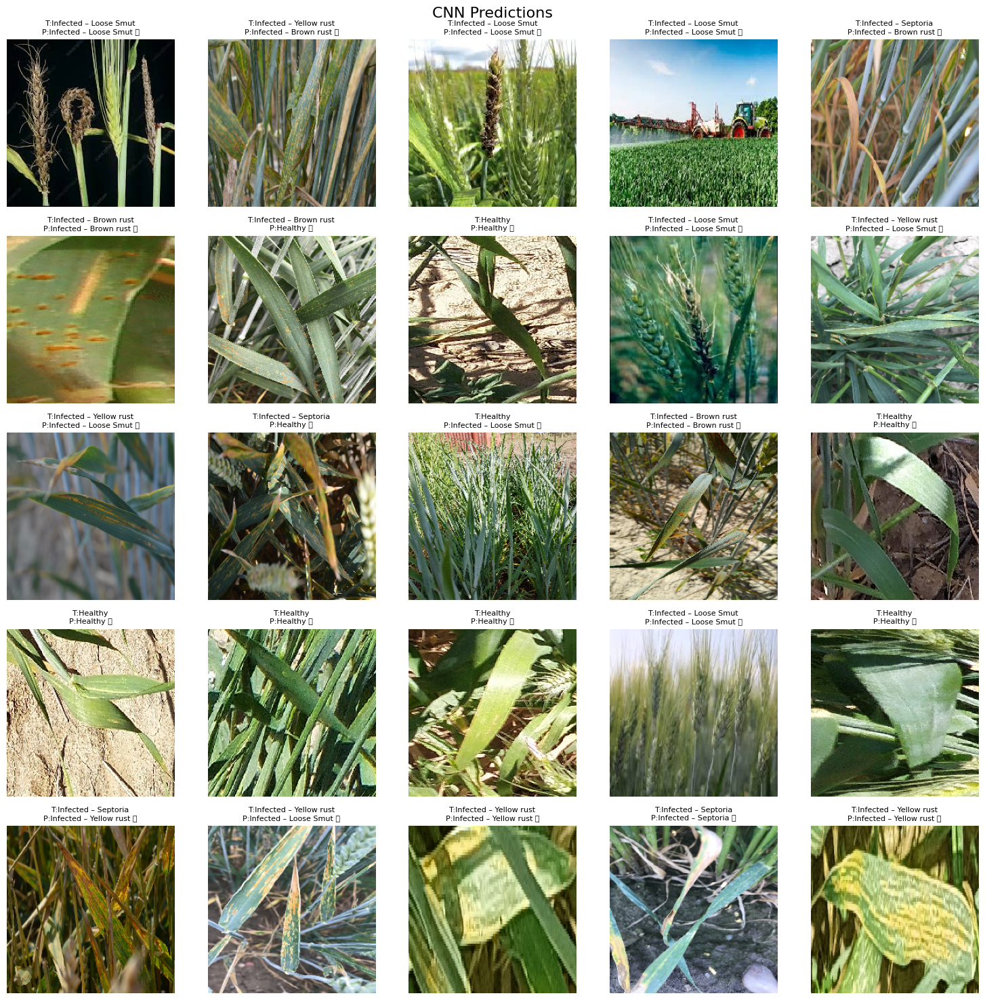

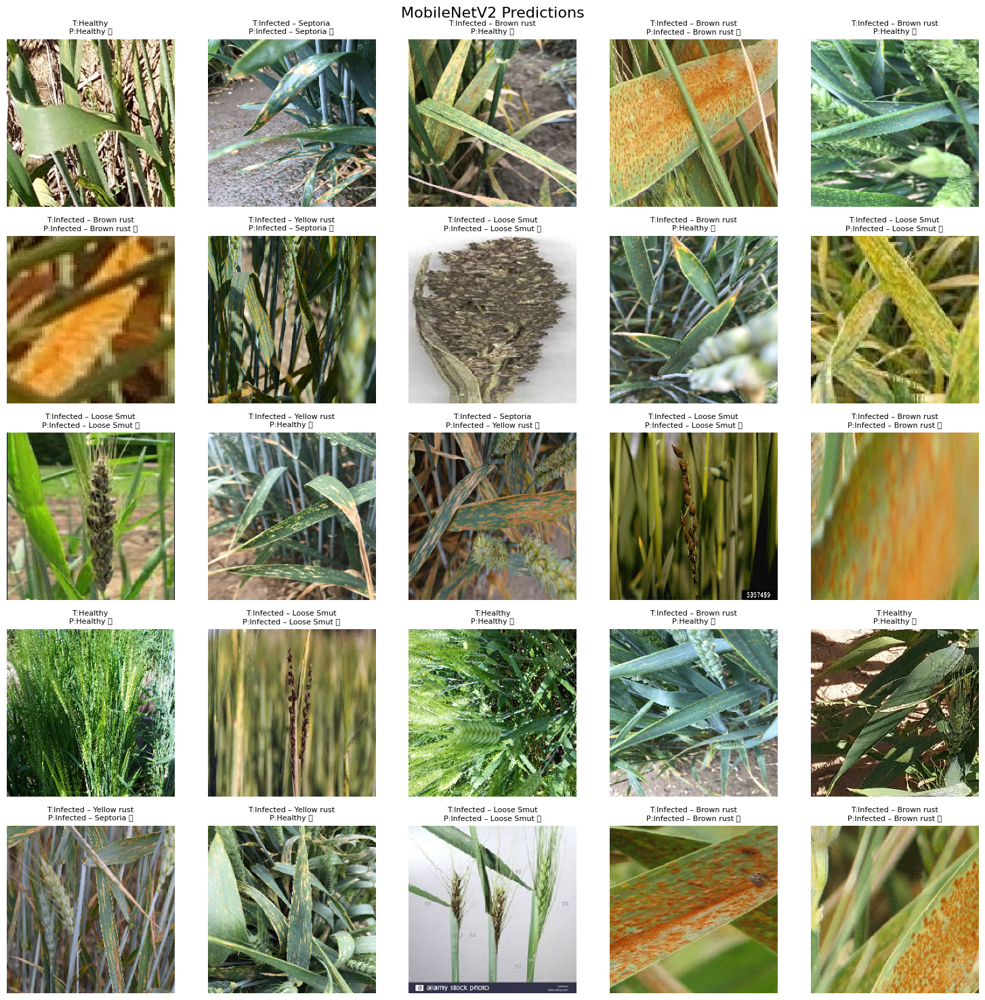

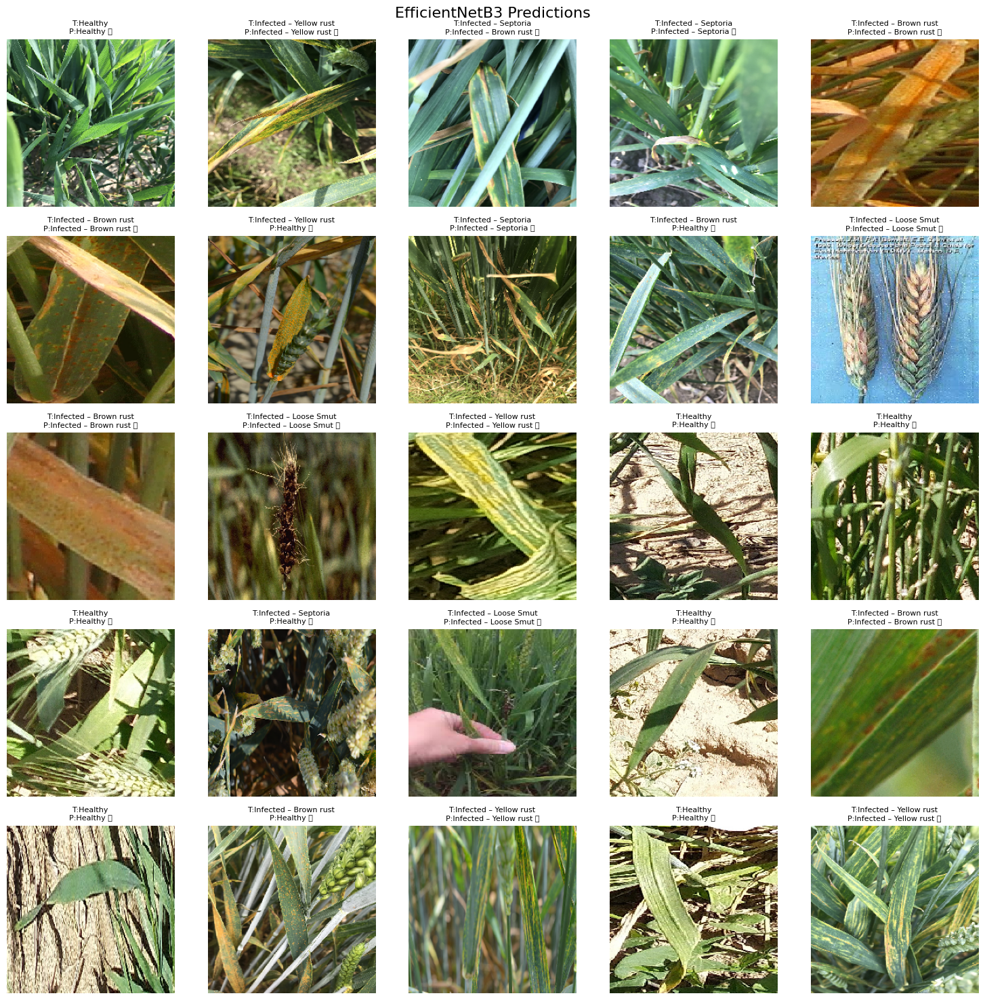

In [14]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import random

def show_predictions(model, model_name, n=25):
    sample_paths = random.sample(val_gen.filepaths, n)
    plt.figure(figsize=(15, 15))
    for i, path in enumerate(sample_paths):
        img = load_img(path, target_size=img_size)
        arr = np.expand_dims(img_to_array(img)/255.0, axis=0)
        pred_idx = np.argmax(model.predict(arr, verbose=0), axis=1)[0]
        pred_label = class_names[pred_idx]
        true_label = path.split("/")[-2]

        # Format labels (Healthy vs Infected)
        if "healthy" in pred_label.lower():
            pred_text = "Healthy"
        else:
            pred_text = f"Infected – {pred_label}"

        if "healthy" in true_label.lower():
            true_text = "Healthy"
        else:
            true_text = f"Infected – {true_label}"

        correct = "✅" if pred_label == true_label else "❌"

        # Plot
        plt.subplot(5,5,i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"T:{true_text}\nP:{pred_text} {correct}", fontsize=8)
    plt.suptitle(f"{model_name} Predictions", fontsize=16)
    plt.tight_layout()
    plt.show()

# Display predictions for each model
show_predictions(cnn_model, "CNN")
show_predictions(mobilenet_model, "MobileNetV2")
show_predictions(eff_model, "EfficientNetB3")


In [15]:
# =============================
# CELL 6: Zip Results
# =============================
output_dir = "crop2-wheat"
os.makedirs(output_dir, exist_ok=True)

files_to_save = [
    "CNN_confusion_matrix.png", "MobileNetV2_confusion_matrix.png", "EfficientNetB3_confusion_matrix.png",
    "CNN_accuracy.png", "CNN_loss.png",
    "MobileNetV2_accuracy.png", "MobileNetV2_loss.png",
    "EfficientNetB3_accuracy.png", "EfficientNetB3_loss.png",
    "CNN_predictions.png", "MobileNetV2_predictions.png", "EfficientNetB3_predictions.png",
    "CNN_classification_report.txt", "MobileNetV2_classification_report.txt", "EfficientNetB3_classification_report.txt"
]

for f in files_to_save:
    if os.path.exists(f):
        shutil.move(f, os.path.join(output_dir, f))

zip_filename = "crop2-wheat.zip"
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    for root, dirs, files in os.walk(output_dir):
        for file in files:
            zipf.write(os.path.join(root, file), 
                       arcname=os.path.relpath(os.path.join(root, file), output_dir))

print(f"✅ All wheat results zipped into {zip_filename}")


✅ All wheat results zipped into crop2-wheat.zip
